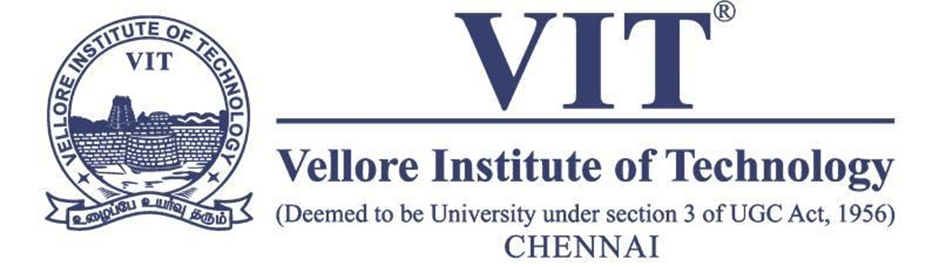

**Name:** Shaahid Ahmed N  
**RegNo.:** 21BAI1087  
**Course & Course Code:** Machine Vision Lab & BCSE417P  
**Lab & Date:** Assesment-2\1 & 17-08-2024  
**Slot:** L43+L44  

By turning in this assignment, I agree and declare that all of this is my own work.

# Imports

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Assignment 1A
## Task 1: Basic Image Statistics and Color Space Conversion
**Objective:**
Compute basic statistics and convert an image into different color spaces.


Mean for Blue channel: 149.14
Mean for Green channel: 162.38
Mean for Red channel: 168.20
Standard Deviation for Blue channel: 54.91
Standard Deviation for Green channel: 48.40
Standard Deviation for Red channel: 49.65


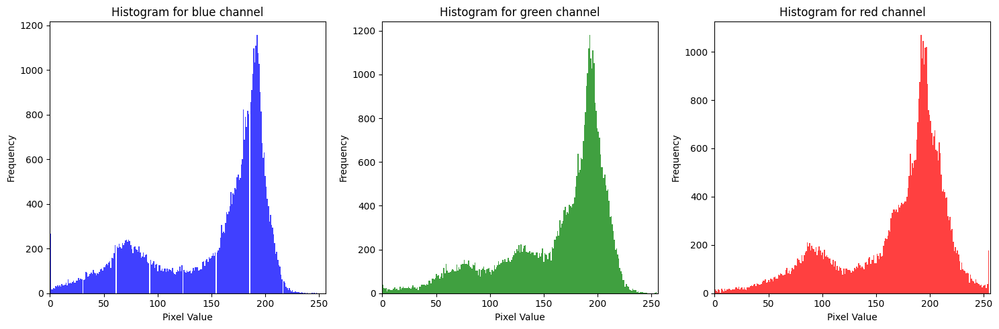

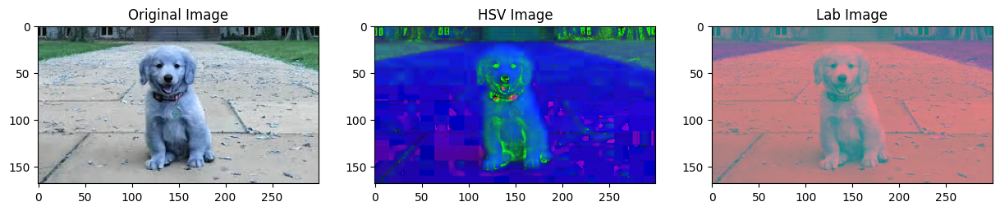

In [2]:
# Step 1: Read the Image
image = cv2.imread('dog.jpeg')

# Step 2: Compute Basic Statistics
means, std_devs = cv2.meanStdDev(image)
means = means.flatten()
std_devs = std_devs.flatten()

print(f"Mean for Blue channel: {means[0]:.2f}")
print(f"Mean for Green channel: {means[1]:.2f}")
print(f"Mean for Red channel: {means[2]:.2f}")

print(f"Standard Deviation for Blue channel: {std_devs[0]:.2f}")
print(f"Standard Deviation for Green channel: {std_devs[1]:.2f}")
print(f"Standard Deviation for Red channel: {std_devs[2]:.2f}")

# Step 3: Calculate and plot histograms for each color channel separately using plt.hist
colors = ('blue', 'green', 'red')
channels = cv2.split(image)
plt.figure(figsize=(15, 5))

for i, (channel, color) in enumerate(zip(channels, colors)):
    plt.subplot(1, 3, i + 1)
    plt.hist(channel.ravel(), bins=256, color=color, alpha=0.75)
    plt.title(f'Histogram for {color} channel')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.xlim([0, 256])

plt.tight_layout()
plt.show()

# Step 4: Convert Color Spaces
image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
image_lab = cv2.cvtColor(image, cv2.COLOR_BGR2Lab)

# Display the images without converting to RGB
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title('Original Image')
plt.subplot(1, 3, 2)
plt.imshow(image_hsv)
plt.title('HSV Image')
plt.subplot(1, 3, 3)
plt.imshow(image_lab)
plt.title('Lab Image')
plt.show()


### Procedure

1. **Read the Image**: Load the image `dog.jpeg` using OpenCV's `cv2.imread` function.
2. **Compute Basic Statistics**: Calculate the mean and standard deviation for each color channel (Blue, Green, Red) using `cv2.meanStdDev`. Flatten the results for easier access and print the statistics.
3. **Calculate and Plot Histograms**: Split the image into its Blue, Green, and Red channels. For each channel, compute and plot a histogram using `plt.hist`, showing the distribution of pixel values.
4. **Convert Color Spaces**: Convert the image from BGR to HSV and Lab color spaces using `cv2.cvtColor`. Display the original, HSV, and Lab images using `plt.imshow`.

### Inference

By following these steps, we can analyze an image's color distribution and visualize its representation in different color spaces. Calculating the mean and standard deviation for each channel provides insights into the image's color balance and variance. Plotting histograms helps in understanding the distribution of pixel intensities across different channels. Converting and displaying the image in HSV and Lab color spaces allows for a comparison of how the image looks in different color representations, which can be useful for various image processing tasks.

## Task 2: Simple Image Segmentation Using Thresholding

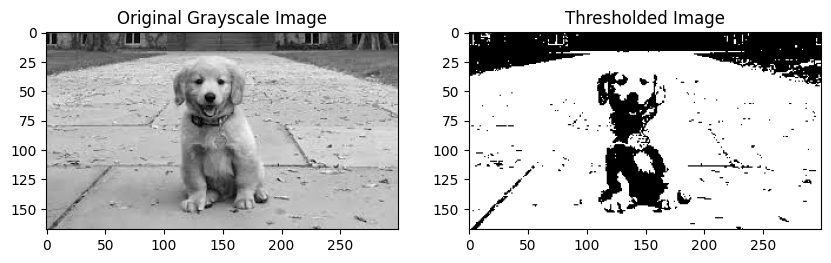

In [3]:
# Step 1: Read the Image
gray_image = cv2.imread('dog.jpeg', cv2.IMREAD_GRAYSCALE)

# Step 2: Apply Thresholding
_, thresholded_image = cv2.threshold(gray_image, 127, 255, cv2.THRESH_BINARY)

# Step 3: Display Results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Grayscale Image')
plt.subplot(1, 2, 2)
plt.imshow(thresholded_image, cmap='gray')
plt.title('Thresholded Image')
plt.show()

### Procedure

1. **Read the Image**: Load the image `dog.jpeg` in grayscale using OpenCV's `cv2.imread` function with the `cv2.IMREAD_GRAYSCALE` flag.
2. **Apply Thresholding**: Convert the grayscale image to a binary image using `cv2.threshold` with a threshold value of 127. All pixel values below 127 are set to 0, and all pixel values equal to or above 127 are set to 255.
3. **Display Results**: Use Matplotlib to display the original grayscale image and the thresholded binary image side by side for comparison.

### Inference

By converting the image to grayscale and applying thresholding, we can simplify the image to binary form, which is useful for various image processing tasks such as object detection and segmentation. This process highlights the difference between the original intensity values and the binarized result, making it easier to distinguish between foreground and background elements in the image.

## Task 3: Color-Based Segmentation

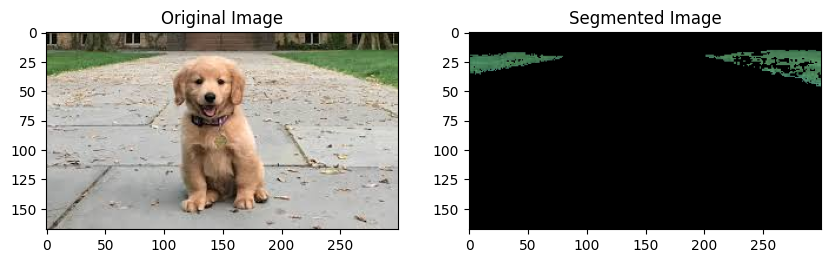

In [4]:
# Step 1: Read the Image
color_image = cv2.imread('dog.jpeg')
image_rgb = cv2.cvtColor(color_image, cv2.COLOR_BGR2RGB)

# Step 2: Convert to HSV
image_hsv = cv2.cvtColor(color_image, cv2.COLOR_BGR2HSV)

# Step 3: Define color range for green and apply color thresholding
lower_green = np.array([35, 100, 100])
upper_green = np.array([85, 255, 255])
mask = cv2.inRange(image_hsv, lower_green, upper_green)
segmented_image = cv2.bitwise_and(color_image, color_image, mask=mask)

# Step 4: Display Results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.subplot(1, 2, 2)
# plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
plt.imshow(segmented_image)
plt.title('Segmented Image')
plt.show()

### Procedure

1. **Read the Image**: Load the image `dog.jpeg` in BGR format using OpenCV's `cv2.imread` function. Convert it to RGB format using `cv2.cvtColor`.
2. **Convert to HSV**: Transform the RGB image to the HSV color space using `cv2.cvtColor`.
3. **Define Color Range for Green and Apply Color Thresholding**: Define the lower and upper bounds for the green color in the HSV space. Create a mask using `cv2.inRange` to identify pixels within this range. Apply the mask to the original image using `cv2.bitwise_and` to obtain the segmented image where only the green regions are retained.
4. **Display Results**: Use Matplotlib to display the original RGB image and the segmented image side by side for comparison.

### Inference

By converting the image to the HSV color space and applying color thresholding, we can isolate and highlight specific color ranges within the image. This technique is particularly useful for tasks such as object detection and image segmentation, where identifying and extracting regions of interest based on color is necessary. The segmented image clearly shows the areas that fall within the specified green range, demonstrating the effectiveness of the color thresholding process.

# Assignment 1B
##  Task 1: Image Negative Transformation
**Objective:** Create an image negative using Python.

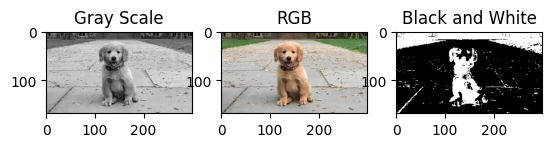

In [5]:
img_bgr = cv2.imread('dog.jpeg')
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_gs = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
(thresh, img_bw) = cv2.threshold(img_gs, 127, 255, cv2.THRESH_BINARY)
img_bw//=255
f = plt.figure()
f.add_subplot(1,3, 1)
plt.imshow(img_gs,cmap='gray')
plt.title('Gray Scale')
f.add_subplot(1,3, 2)
plt.imshow(img_rgb)
plt.title('RGB')
f.add_subplot(1,3, 3)
plt.imshow(img_bw,cmap='binary')
plt.title('Black and White')
plt.show(block=True)

### Procedure

1. **Read and Convert the Image**: 
   - Load the image `dog.jpeg` in BGR format using `cv2.imread`.
   - Convert the BGR image to RGB format using `cv2.cvtColor`.
   - Convert the RGB image to grayscale using `cv2.cvtColor`.

2. **Apply Thresholding**:
   - Apply a binary threshold to the grayscale image using `cv2.threshold` with a threshold value of 127. This results in a black and white image where pixel values are either 0 or 255.
   - Normalize the black and white image to binary format by dividing by 255.

3. **Display Results**:
   - Use Matplotlib to display the grayscale, RGB, and black and white images side by side for comparison.
   - Set the color maps appropriately for each image type (`gray` for grayscale and `binary` for the black and white image).

### Inference

By reading and converting the image through various formats (RGB, grayscale, black and white), you can visualize the impact of these transformations on the image. The grayscale image simplifies the image to shades of gray, removing color information. The black and white image further reduces this to binary values, highlighting the contrast and making it easier to distinguish between different regions based on pixel intensity. Displaying these variations side by side provides a comprehensive view of how each transformation affects the visual representation of the image.

In [6]:
# Negative Transform
def negativeLT(img,bit):
    L = 2**bit
    return L-1-img

### Procedure

1. **Define the Negative Transform Function**:
   - Create a function `negativeLT` that takes an image and the bit depth as input.
   - Calculate the maximum intensity value `L` for the given bit depth using the formula \( L = 2^{\text{bit}} \).
   - Compute the negative of the image by subtracting each pixel value from \( L - 1 \).

2. **Apply the Negative Transform**:
   - Load the image `dog.jpeg` in grayscale or any other format.
   - Apply the `negativeLT` function to the image to obtain its negative transformation.

### Inference

By applying the negative transform to an image, you invert its pixel values, which effectively creates a photographic negative of the original image. This transformation can be useful in various image processing tasks, such as enhancing contrast or highlighting certain features that are less visible in the original image. The negative image emphasizes darker regions as lighter and vice versa, providing an alternative perspective of the image's content.

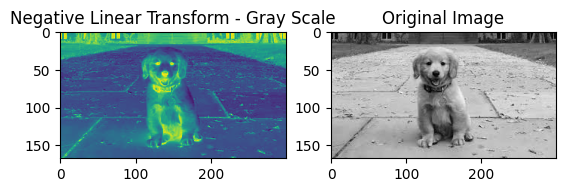

In [7]:
# Load Gray Scale Image
img = img_gs
# Apply the image negative transformation.
f = plt.figure()
f.add_subplot(1,2, 1)
plt.imshow(negativeLT(img,8))
plt.title('Negative Linear Transform - Gray Scale')
f.add_subplot(1,2, 2)
plt.imshow(img,cmap='gray')
plt.title('Original Image')
plt.show(block=True)

### Procedure

1. **Load the Grayscale Image**:
   - Use `cv2.imread` to read the image `dog.jpeg` in grayscale format, storing it in the variable `img`.

2. **Apply the Negative Transform**:
   - Use the previously defined `negativeLT` function to apply the negative transformation to the grayscale image. The function takes the image and bit depth (8 in this case) as input and returns the negative image.

3. **Display Results**:
   - Use Matplotlib to display the negative transformed grayscale image and the original grayscale image side by side for comparison.
   - Ensure the correct color maps are applied for each image type (`gray` for the original grayscale image).

### Inference

Applying the negative transform to a grayscale image inverts its pixel values, creating a photographic negative of the image. This transformation can enhance contrast and reveal details that are less noticeable in the original image. Displaying the original and negative images side by side allows for a clear comparison of the effects of the transformation.

## Task 2: Gamma Correction
**Objective:** Apply gamma correction with different gamma values.

In [8]:
def powerT(img,c,gamma):
    img = c*((img/255)**gamma)
    img = np.clip(img * 255.0, 0, 255)
    return np.int32(img)

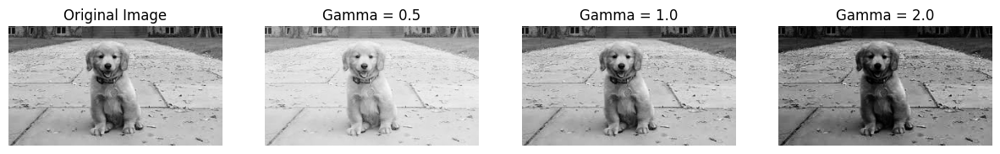

In [9]:
# Load Gray Scale Image
img = img_gs
# Apply gamma correction with γ=0.5,γ=1.0,γ=2.0.
gamma_values = [0.5, 1.0, 2.0]
corrected_images = [powerT(img, 1, gamma) for gamma in gamma_values]
# Plot the original and corrected images
f, axs = plt.subplots(1, 4, figsize=(15, 5))
axs[0].imshow(img, cmap='gray')
axs[0].set_title('Original Image')
axs[0].axis('off')
for i, (gamma, corrected_img) in enumerate(zip(gamma_values, corrected_images)):
    axs[i + 1].imshow(corrected_img, cmap='gray')
    axs[i + 1].set_title(f'Gamma = {gamma}')
    axs[i + 1].axis('off')
plt.show()

### Procedure

1. **Define the Power (Gamma) Transform Function**:
   - Create a function `powerT` that takes an image, a constant \( c \), and a gamma value as input.
   - Apply the gamma correction using the formula \( \text{output} = c \cdot (\text{input} / 255)^{\gamma} \).
   - Scale the result back to the range [0, 255] and clip any values outside this range. Convert the result to an integer type.

2. **Load the Grayscale Image**:
   - Read the image `dog.jpeg` in grayscale format using `cv2.imread`.

3. **Apply Gamma Correction**:
   - Use the `powerT` function to apply gamma correction to the grayscale image with different gamma values (\( \gamma = 0.5 \), \( \gamma = 1.0 \), and \( \gamma = 2.0 \)).

4. **Plot the Original and Corrected Images**:
   - Use Matplotlib to display the original grayscale image and the gamma-corrected images side by side for comparison.
   - Label each image with the corresponding gamma value.

### Inference

Gamma correction adjusts the brightness and contrast of an image by applying a non-linear transformation. Different gamma values have varying effects:
- **Gamma < 1.0**: Brightens the image.
- **Gamma = 1.0**: No change (identity transformation).
- **Gamma > 1.0**: Darkens the image.

By displaying the original and gamma-corrected images side by side, you can observe how gamma correction affects the visual characteristics of the image.

## Task 3: Log Transform
**Objective:** Apply log transformation to enhance an image.

In [10]:
def LogT(img,c):
    img = img/255.0
    img = c*np.log(img+1)
    img = np.clip(img * 255.0, 0, 255)
    return np.int32(img)

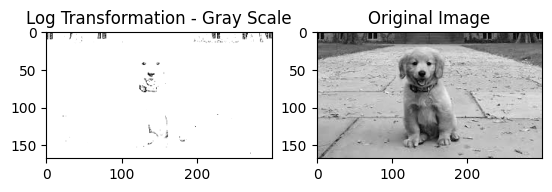

In [11]:
# Load Gray Scale Image
img = img_gs
# Apply the Log transformation.
f = plt.figure()
f.add_subplot(1,2, 1)
plt.imshow(LogT(img,8), cmap='gray')
plt.title('Log Transformation - Gray Scale')
f.add_subplot(1,2, 2)
plt.imshow(img,cmap='gray')
plt.title('Original Image')
plt.show(block=True)

### Procedure

1. **Define the Log Transformation Function**:
   - Create a function `LogT` that takes an image and a constant \( c \) as input.
   - Normalize the image pixel values to the range [0, 1] by dividing by 255.
   - Apply the logarithmic transformation using the formula \( \text{output} = c \cdot \log(\text{input} + 1) \).
   - Scale the result back to the range [0, 255] and clip any values outside this range. Convert the result to an integer type.

2. **Load the Grayscale Image**:
   - Read the image `dog.jpeg` in grayscale format using `cv2.imread` and store it in the variable `img`.

3. **Apply the Log Transformation**:
   - Use the `LogT` function to apply the log transformation to the grayscale image with a constant \( c = 8 \).

4. **Plot the Original and Log-Transformed Images**:
   - Use Matplotlib to display the log-transformed grayscale image and the original grayscale image side by side for comparison.
   - Label each image appropriately.

### Inference

The log transformation enhances the details in darker regions of the image while compressing the lighter regions. This is useful for enhancing the contrast of low-intensity features and improving visibility in dark areas. By comparing the log-transformed image with the original grayscale image, you can observe how this transformation affects the brightness and contrast of the image.

##  Task 4: Compare Transformations
**Objective:** Compare the effects of different transformations.

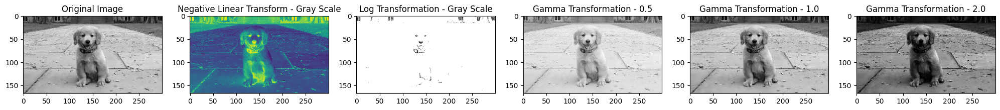

In [12]:
# Load Gray Scale Image
img = img_gs

#Compare Transformations
plt.figure(figsize=(25, 5))
plt.subplot(1, 6, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.subplot(1, 6, 2)
plt.imshow(negativeLT(img,8))
plt.title('Negative Linear Transform - Gray Scale')
plt.subplot(1, 6, 3)
plt.imshow(LogT(img,8), cmap='gray')
plt.title('Log Transformation - Gray Scale')
plt.subplot(1, 6, 4)
plt.imshow(corrected_images[0], cmap='gray')
plt.title('Gamma Transformation - 0.5')
plt.subplot(1, 6, 5)
plt.imshow(LogT(img,8))
plt.imshow(corrected_images[1], cmap='gray')
plt.title('Gamma Transformation - 1.0')
plt.subplot(1, 6, 6)
plt.imshow(corrected_images[2], cmap='gray')
plt.title('Gamma Transformation - 2.0')
plt.show()

### Procedure

1. **Load the Grayscale Image**:
   - Use `cv2.imread` to read the image `dog.jpeg` in grayscale format and store it in the variable `img`.

2. **Define and Apply Transformations**:
   - **Negative Transformation**: Use the previously defined `negativeLT` function to apply a negative transformation to the image.
   - **Log Transformation**: Use the previously defined `LogT` function to apply a log transformation to the image with a constant \( c = 8 \).
   - **Gamma Transformation**: Use the previously defined `powerT` function to apply gamma correction to the image with gamma values \( \gamma = 0.5 \), \( \gamma = 1.0 \), and \( \gamma = 2.0 \).

3. **Display Results**:
   - Use Matplotlib to display the original image and the transformed images side by side for comparison.
   - Label each image appropriately with the corresponding transformation applied.

### Inference

Comparing different image transformations allows you to observe how each technique affects the visual characteristics of the image:
- **Negative Transformation**: Inverts the pixel values, creating a photographic negative.
- **Log Transformation**: Enhances details in darker regions while compressing the lighter regions, improving contrast in low-intensity areas.
- **Gamma Transformation**: Adjusts brightness and contrast based on the gamma value:
  - **Gamma < 1.0**: Brightens the image.
  - **Gamma = 1.0**: No change.
  - **Gamma > 1.0**: Darkens the image.

## Task 5: Apply Transformations to Color Images
**Objective:** Apply the transformations to a color image by processing each channel separately.

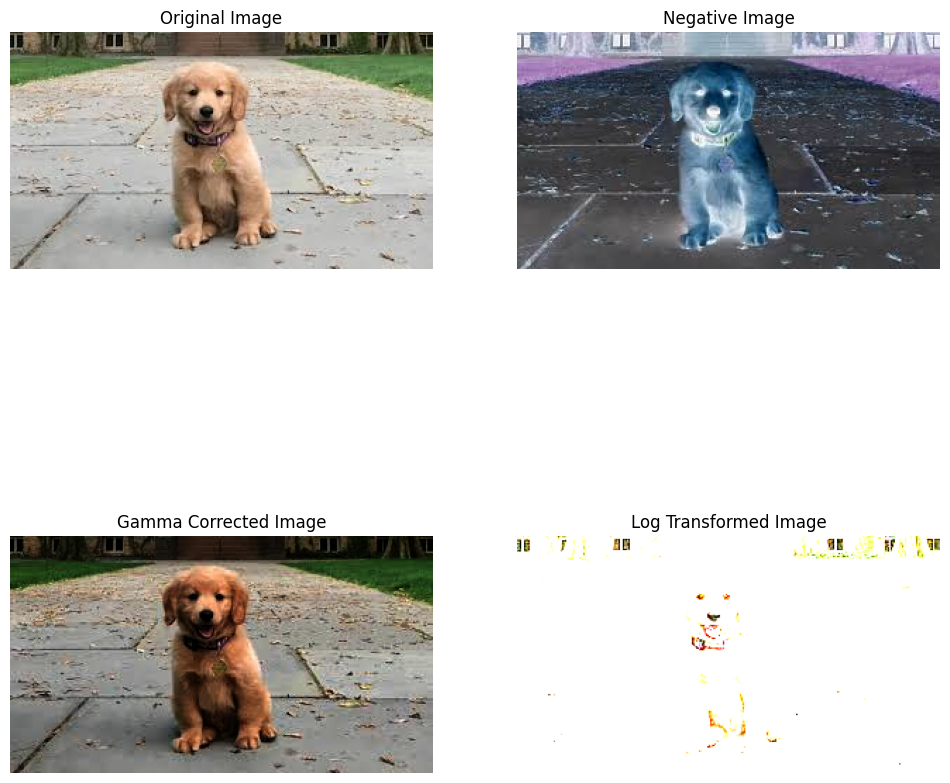

In [13]:
# Load a color image
image = cv2.imread('dog.jpeg')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Split the image into its R, G, and B channels
R, G, B = cv2.split(image_rgb)

# Apply transformations to each channel
R_neg = negativeLT(R,8)
G_neg = negativeLT(G,8)
B_neg = negativeLT(B,8)

R_gamma = powerT(R,1,2.0)
G_gamma = powerT(G,1,2.0)
B_gamma = powerT(B,1,2.0)

R_log = LogT(R,8)
G_log = LogT(G,8)
B_log = LogT(B,8)

# Merge the channels back together
image_neg = cv2.merge([R_neg, G_neg, B_neg])
image_gamma = cv2.merge([R_gamma, G_gamma, B_gamma])
image_log = cv2.merge([R_log, G_log, B_log])

# Display the original and the transformed images
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

axs[0, 0].imshow(image_rgb)
axs[0, 0].set_title('Original Image')
axs[0, 0].axis('off')

axs[0, 1].imshow(image_neg)
axs[0, 1].set_title('Negative Image')
axs[0, 1].axis('off')

axs[1, 0].imshow(image_gamma)
axs[1, 0].set_title('Gamma Corrected Image')
axs[1, 0].axis('off')

axs[1, 1].imshow(image_log)
axs[1, 1].set_title('Log Transformed Image')
axs[1, 1].axis('off')

plt.show()

### Procedure

1. **Load the Color Image**:
   - Read the image `dog.jpeg` using `cv2.imread` and convert it from BGR to RGB format using `cv2.cvtColor`.

2. **Split the Image into Channels**:
   - Split the RGB image into its individual Red (R), Green (G), and Blue (B) channels using `cv2.split`.

3. **Apply Transformations to Each Channel**:
   - **Negative Transformation**: Use the `negativeLT` function to apply a negative transformation to each of the R, G, and B channels.
   - **Gamma Transformation**: Use the `powerT` function to apply gamma correction with \( \gamma = 2.0 \) to each of the R, G, and B channels.
   - **Log Transformation**: Use the `LogT` function to apply a logarithmic transformation to each of the R, G, and B channels.

4. **Merge the Transformed Channels Back Together**:
   - Use `cv2.merge` to combine the transformed R, G, and B channels back into full-color images for each transformation type.

5. **Display the Original and Transformed Images**:
   - Use Matplotlib to display the original image and the three transformed images (negative, gamma corrected, and log transformed) in a 2x2 grid layout.

### Inference

Transforming individual color channels allows for the comparison of various image processing techniques and their effects on color images:
- **Negative Transformation**: Inverts the colors, creating a photographic negative effect.
- **Gamma Transformation**: Adjusts the brightness and contrast, with \( \gamma = 2.0 \) darkening the image.
- **Log Transformation**: Enhances details in darker regions while compressing the lighter regions, improving contrast in low-intensity areas.

By displaying the original and transformed images side by side, it becomes clear how each transformation modifies the image's visual characteristics.

# Assignment 1C - Image Enhancement- Histogram Equalization
## Task 1: Introduction to Histogram EqualizatioTask 1: Introduction to Histogram Equalization
**Objective:** Understand the basics of histogram equalization and its impact on image contrast.

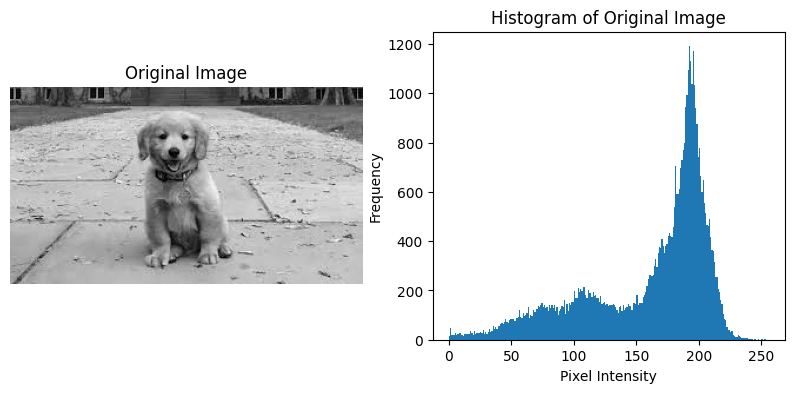

In [14]:
#Load grayscale image
image = img_gs
# Display the image
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Plot the histogram
plt.subplot(1, 2, 2)
plt.hist(image.ravel(), bins=256, range=[0, 256])
plt.title('Histogram of Original Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.show()

### Procedure

1. **Load the Grayscale Image**:
   - Use the previously loaded grayscale image stored in the variable `img_gs` and assign it to `image`.

2. **Display the Original Image**:
   - Use Matplotlib to display the grayscale image with a grayscale color map (`cmap='gray'`).
   - Set the title to "Original Image" and remove axis labels for clarity.

3. **Plot the Histogram of the Original Image**:
   - Use Matplotlib to create a histogram of the pixel intensity values in the grayscale image.
   - Use `image.ravel()` to flatten the image into a 1D array and plot the histogram with 256 bins, corresponding to the range of pixel values from 0 to 255.
   - Set the title to "Histogram of Original Image" and label the x-axis as "Pixel Intensity" and the y-axis as "Frequency".

### Inference

Displaying the grayscale image alongside its histogram provides insights into the distribution of pixel intensities. The histogram shows the frequency of each pixel value, revealing the contrast and brightness characteristics of the image. A well-distributed histogram indicates good contrast, while a histogram concentrated in a narrow range suggests low contrast. This information is useful for further image processing and enhancement techniques.

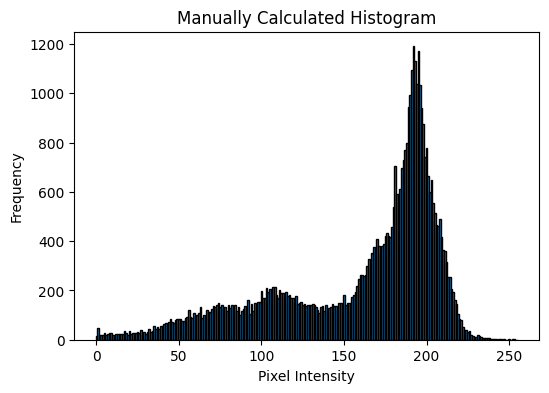

In [15]:
# Manually calculate the histogram
hist = np.zeros(256)
for pixel in image.ravel():
    hist[pixel] += 1

# Plot the manually calculated histogram
plt.figure(figsize=(6, 4))
plt.bar(range(256), hist, width=1, edgecolor='black')
plt.title('Manually Calculated Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.show()

### Procedure

1. **Manually Calculate the Histogram**:
   - Initialize a zero array `hist` of length 256 to store the frequency of each pixel intensity value.
   - Flatten the grayscale image using `image.ravel()` to iterate over each pixel.
   - Increment the corresponding index in the histogram array for each pixel value.

2. **Plot the Manually Calculated Histogram**:
   - Use Matplotlib to create a bar plot of the manually calculated histogram.
   - Use `range(256)` for the x-axis, representing pixel intensity values from 0 to 255.
   - Set the width of each bar to 1 and use `edgecolor='black'` for better visual distinction.
   - Set the title to "Manually Calculated Histogram" and label the x-axis as "Pixel Intensity" and the y-axis as "Frequency".

### Inference

Manually calculating the histogram allows for a deeper understanding of how histogram data is collected and visualized. This step-by-step process ensures that you understand the frequency distribution of pixel intensities in the grayscale image. This histogram provides a visual representation of the image's contrast and brightness, and any potential issues such as poor contrast or lighting can be identified and addressed.

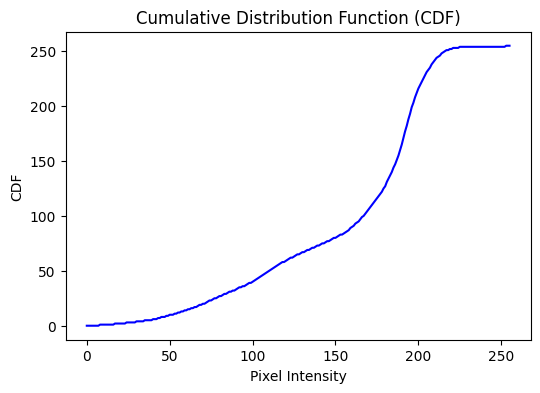

In [34]:
# Compute the CDF
cdf = hist.cumsum()
L=len(hist)
# Normalize the CDF to the range [0, 255]
cdf_normalized = cdf *(L-1)/ cdf.max()
cdf_normalized = cdf_normalized.astype('uint8')

# Plot the CDF
plt.figure(figsize=(6, 4))
plt.plot(cdf_normalized, color='blue')
plt.title('Cumulative Distribution Function (CDF)')
plt.xlabel('Pixel Intensity')
plt.ylabel('CDF')
plt.show()

### Procedure

1. **Compute the Cumulative Distribution Function (CDF)**:
   - Use the cumulative sum function `cumsum` on the manually calculated histogram to obtain the CDF.
   - Determine the length `L` of the histogram array.

2. **Normalize the CDF**:
   - Normalize the CDF to the range [0, 255] by scaling it with `(L-1)/cdf.max()`.
   - Convert the normalized CDF to `uint8` data type for proper pixel intensity representation.

3. **Plot the CDF**:
   - Use Matplotlib to plot the normalized CDF.
   - Set the title to "Cumulative Distribution Function (CDF)".
   - Label the x-axis as "Pixel Intensity" and the y-axis as "CDF".
   - Use a blue color for the plot line to differentiate it visually.

### Inference

Plotting the Cumulative Distribution Function (CDF) of the grayscale image's histogram provides a comprehensive view of the cumulative probability distribution of pixel intensities. The CDF can be used for various purposes, such as image equalization and contrast adjustment, by mapping the original pixel values to new values based on their cumulative probabilities. This plot is essential in understanding the cumulative behavior of pixel intensities across the image, which is crucial for image enhancement techniques.

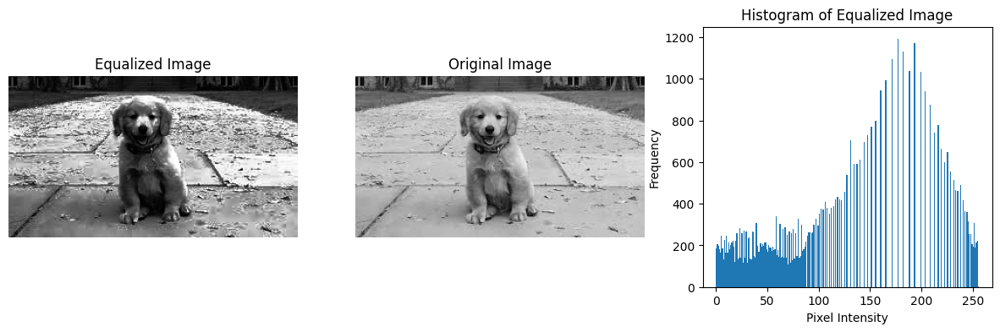

In [30]:
# Map the original pixel values to equalized values using the CDF
equalized_image = cdf_normalized[image]

# Display the equalized image
plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

# Display the image
plt.subplot(1, 3, 2)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Plot the histogram of the equalized image
plt.subplot(1, 3, 3)
plt.hist(equalized_image.ravel(), bins=256, range=[0, 256])
plt.title('Histogram of Equalized Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.show()


### Procedure

1. **Map the Original Pixel Values to Equalized Values Using the CDF**:
   - Use the normalized CDF to map the original pixel values in the grayscale image to their equalized values.
   - The mapping is performed by indexing the `cdf_normalized` array with the original image pixel values.

2. **Display the Equalized Image**:
   - Use Matplotlib to display the equalized grayscale image with a grayscale color map (`cmap='gray'`).
   - Set the title to "Equalized Image" and remove axis labels for clarity.

3. **Display the Original Image**:
   - Use Matplotlib to display the original grayscale image with a grayscale color map (`cmap='gray'`).
   - Set the title to "Original Image" and remove axis labels for clarity.

4. **Plot the Histogram of the Equalized Image**:
   - Use Matplotlib to create a histogram of the pixel intensity values in the equalized grayscale image.
   - Use `equalized_image.ravel()` to flatten the image into a 1D array and plot the histogram with 256 bins, corresponding to the range of pixel values from 0 to 255.
   - Set the title to "Histogram of Equalized Image" and label the x-axis as "Pixel Intensity" and the y-axis as "Frequency".

### Inference

Equalizing the image using the CDF improves the contrast by spreading out the pixel intensity values more uniformly across the entire range. This process enhances the visibility of details in areas of the image that were originally too dark or too bright. The histogram of the equalized image should ideally be more uniformly distributed compared to the histogram of the original image, indicating a better contrast distribution.

## Task 2: Comparing Histogram Equalization Techniques
**Objective:** Compare standard histogram equalization with adaptive histogram equalization.

In [32]:
def manual_histogram_equalization(tile):
    # Manually calculate the histogram
    hist = np.zeros(256)
    for pixel in tile.ravel():
        hist[pixel] += 1
    
    # Compute the CDF
    cdf = hist.cumsum()
    
    L=len(hist)
    # Normalize the CDF to the range [0, 255]
    cdf_normalized = cdf *(L-1)/ cdf.max()
    cdf_normalized = cdf_normalized.astype('uint8')
    
    # Map the original pixel values to equalized values using the CDF
    equalized_tile = cdf_normalized[tile]
    
    return equalized_tile

def adaptive_histogram_equalization(image, tile_size=(8, 8)):
    # Create an empty image to store the result
    ahe_image = np.zeros_like(image)
    
    # Get the number of tiles
    num_tiles_y = image.shape[0] // tile_size[0]
    num_tiles_x = image.shape[1] // tile_size[1]
    
    # Apply histogram equalization to each tile
    for i in range(num_tiles_y):
        for j in range(num_tiles_x):
            # Extract the tile
            tile = image[i*tile_size[0]:(i+1)*tile_size[0], j*tile_size[1]:(j+1)*tile_size[1]]
            
            # Equalize the histogram of the tile
            tile_equalized = manual_histogram_equalization(tile)
            
            # Place the equalized tile back into the image
            ahe_image[i*tile_size[0]:(i+1)*tile_size[0], j*tile_size[1]:(j+1)*tile_size[1]] = tile_equalized
            
    return ahe_image

### Procedure

1. **Define Manual Histogram Equalization Function**:
   - Manually calculate the histogram of pixel values within a given tile.
   - Compute the Cumulative Distribution Function (CDF) from the histogram.
   - Normalize the CDF to the range [0, 255].
   - Map the original pixel values to the equalized values using the normalized CDF.

2. **Define Adaptive Histogram Equalization Function**:
   - Initialize an empty image to store the result of adaptive histogram equalization (AHE).
   - Determine the number of tiles in the y and x directions based on the image size and tile size.
   - Loop through each tile in the image:
     - Extract the current tile.
     - Apply the manual histogram equalization function to the tile.
     - Replace the original tile in the image with the equalized tile.
   - Return the AHE image.

### Inference

Adaptive Histogram Equalization (AHE) enhances the contrast of an image by dividing it into smaller regions (tiles) and applying histogram equalization to each tile individually. This method can improve local contrast and reveal more details in different parts of the image. The manual implementation of histogram equalization within each tile ensures that the contrast enhancement is tailored to the local intensity distribution, providing a more detailed and balanced result compared to global histogram equalization.

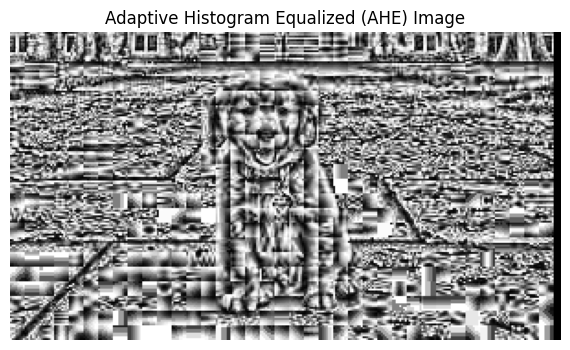

In [35]:
# Apply AHE to the image
ahe_image = adaptive_histogram_equalization(image)

# Display the AHE image
plt.figure(figsize=(10, 4))
plt.imshow(ahe_image, cmap='gray')
plt.title('Adaptive Histogram Equalized (AHE) Image')
plt.axis('off')
plt.show()

### Procedure

1. **Apply Adaptive Histogram Equalization (AHE) to the Image**:
   - Use the `adaptive_histogram_equalization` function to process the grayscale image, enhancing local contrast by equalizing each tile individually.
   - Store the resulting image in the `ahe_image` variable.

2. **Display the AHE Image**:
   - Use Matplotlib to display the AHE image with a grayscale color map (`cmap='gray'`).
   - Set the title to "Adaptive Histogram Equalized (AHE) Image" and remove axis labels for clarity.

### Inference

The Adaptive Histogram Equalization (AHE) process significantly enhances the local contrast of the image, revealing details that were not easily visible in the original image. This method is particularly useful for images with varying lighting conditions, as it improves the contrast in different regions of the image independently.

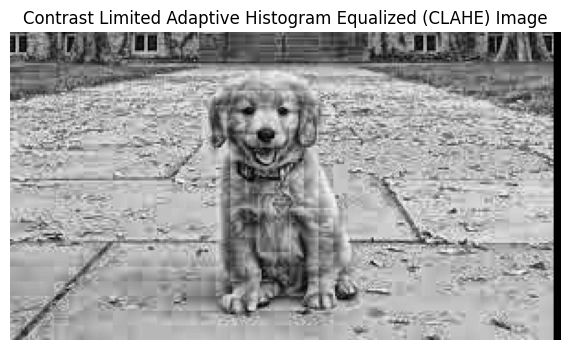

In [37]:
def clahe(tile, clip_limit):
    # Manually calculate the histogram
    hist = np.zeros(256)
    for pixel in tile.ravel():
        hist[pixel] += 1
    
    # Clip the histogram
    clip_limit_value = clip_limit * tile.size / 256.0
    excess = np.maximum(hist - clip_limit_value, 0)
    hist = np.minimum(hist, clip_limit_value)
    
    # Redistribute the excess
    excess_total = excess.sum()
    hist += excess_total / 256
    
    # Compute the CDF
    cdf = hist.cumsum()
    
    L=len(hist)
    # Normalize the CDF to the range [0, 255]
    cdf_normalized = cdf *(L-1)/ cdf.max()
    cdf_normalized = cdf_normalized.astype('uint8')
    
    # Map the original pixel values to equalized values using the CDF
    equalized_tile = cdf_normalized[tile]
    
    return equalized_tile

def contrast_limited_adaptive_histogram_equalization(image, tile_size=(8, 8), clip_limit=2.0):
    # Create an empty image to store the result
    clahe_image = np.zeros_like(image)
    
    # Get the number of tiles
    num_tiles_y = image.shape[0] // tile_size[0]
    num_tiles_x = image.shape[1] // tile_size[1]
    
    # Apply CLAHE to each tile
    for i in range(num_tiles_y):
        for j in range(num_tiles_x):
            # Extract the tile
            tile = image[i*tile_size[0]:(i+1)*tile_size[0], j*tile_size[1]:(j+1)*tile_size[1]]
            
            # Apply CLAHE to the tile
            tile_equalized = clahe(tile, clip_limit)
            
            # Place the equalized tile back into the image
            clahe_image[i*tile_size[0]:(i+1)*tile_size[0], j*tile_size[1]:(j+1)*tile_size[1]] = tile_equalized
            
    return clahe_image

# Apply CLAHE to the image
clahe_image = contrast_limited_adaptive_histogram_equalization(image)

# Display the CLAHE image
plt.figure(figsize=(10, 4))
plt.imshow(clahe_image, cmap='gray')
plt.title('Contrast Limited Adaptive Histogram Equalized (CLAHE) Image')
plt.axis('off')
plt.show()


### Procedure

1. **Define CLAHE Function**:
   - **Calculate the Histogram**: Compute the histogram of pixel intensities for a given tile.
   - **Clip the Histogram**: Limit the histogram values to prevent over-enhancement. Redistribute the excess values to maintain the total number of pixels.
   - **Compute and Normalize CDF**: Calculate the cumulative distribution function (CDF) and normalize it to the range [0, 255].
   - **Map Pixel Values**: Use the normalized CDF to map the original pixel values to equalized values.

2. **Define Contrast Limited Adaptive Histogram Equalization (CLAHE) Function**:
   - **Initialize Result Image**: Create an empty image to store the CLAHE results.
   - **Divide the Image into Tiles**: Split the image into smaller tiles and apply the CLAHE function to each tile.
   - **Reassemble the Image**: Combine the equalized tiles to form the final CLAHE image.

3. **Apply CLAHE to the Image**:
   - Process the grayscale image using the `contrast_limited_adaptive_histogram_equalization` function with specified tile size and clip limit.

4. **Display the CLAHE Image**:
   - Use Matplotlib to display the CLAHE image with a grayscale color map (`cmap='gray'`).
   - Set the title to "Contrast Limited Adaptive Histogram Equalized (CLAHE) Image" and remove axis labels for clarity.

### Inference

Contrast Limited Adaptive Histogram Equalization (CLAHE) improves the contrast of an image by addressing both local contrast and over-enhancement issues. The clipping limit ensures that extreme contrast enhancements are controlled, making CLAHE particularly effective for enhancing details in high-contrast regions without introducing excessive noise. This approach provides a balanced enhancement of local contrast and is beneficial for various applications, including medical imaging and low-light conditions.

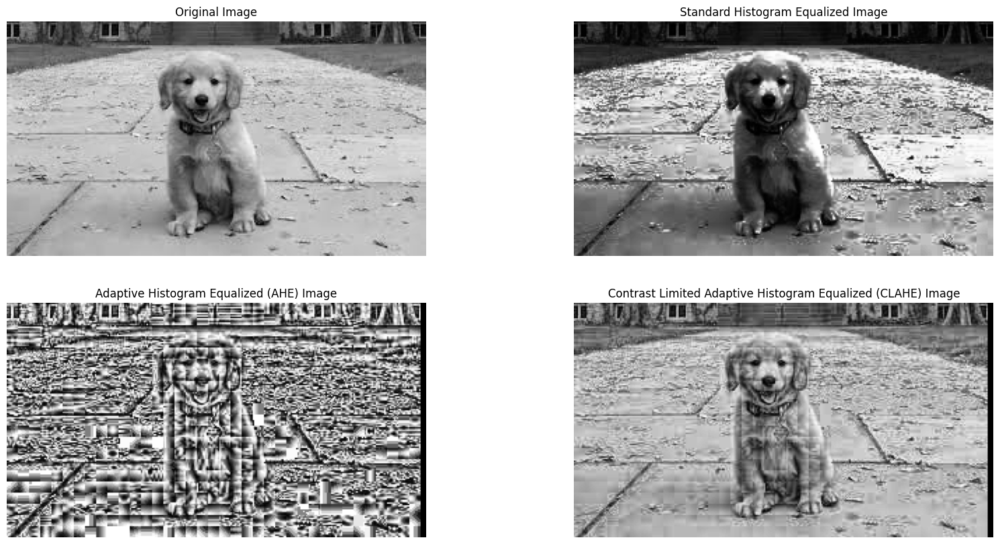

In [38]:
# Apply standard histogram equalization
standard_equalized_image = manual_histogram_equalization(image)

# Display all images side by side
plt.figure(figsize=(20, 10))

plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(standard_equalized_image, cmap='gray')
plt.title('Standard Histogram Equalized Image')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(ahe_image, cmap='gray')
plt.title('Adaptive Histogram Equalized (AHE) Image')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(clahe_image, cmap='gray')
plt.title('Contrast Limited Adaptive Histogram Equalized (CLAHE) Image')
plt.axis('off')

plt.show()

### Procedure

1. **Apply Standard Histogram Equalization**:
   - Use the `manual_histogram_equalization` function to process the grayscale image. This function applies global histogram equalization to enhance contrast.

2. **Display All Images**:
   - **Original Image**: Show the original grayscale image.
   - **Standard Histogram Equalized Image**: Display the result of applying global histogram equalization.
   - **Adaptive Histogram Equalized (AHE) Image**: Display the result of applying adaptive histogram equalization.
   - **Contrast Limited Adaptive Histogram Equalized (CLAHE) Image**: Display the result of applying CLAHE.

   Use Matplotlib to create a side-by-side comparison of these images, ensuring clarity in contrast enhancement methods.

### Inference

Comparing these images will reveal how each method affects contrast enhancement:

- **Original Image**: Provides the baseline for contrast.
- **Standard Histogram Equalized Image**: Shows the global contrast enhancement which might lead to over-enhancement or loss of detail in some regions.
- **Adaptive Histogram Equalized (AHE) Image**: Demonstrates local contrast enhancement, improving detail in different regions but potentially introducing artifacts at tile boundaries.
- **Contrast Limited Adaptive Histogram Equalized (CLAHE) Image**: Combines local contrast enhancement with a clipping mechanism to control excessive contrast, offering a balanced enhancement with reduced artifacts.

## Task 3: Implementing Histogram Equalization on Color Images
**Objective:** Apply histogram equalization to color images.

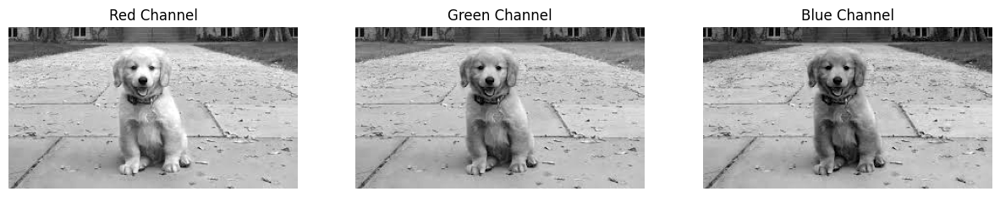

In [44]:
# Load the color image
color_image = img_rgb

# Separate the color channels
r_channel, g_channel, b_channel = cv2.split(color_image)

# Display the separated color channels
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(r_channel, cmap='gray')
plt.title('Red Channel')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(g_channel, cmap='gray')
plt.title('Green Channel')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(b_channel, cmap='gray')
plt.title('Blue Channel')
plt.axis('off')

plt.show()

### Procedure

1. **Load and Process Color Image**:
   - **Load the Image**: Use the `img_rgb` variable to load the color image.
   - **Separate Color Channels**: Use OpenCV to split the image into its Red, Green, and Blue channels.

2. **Display Color Channels**:
   - **Red Channel**: Display the Red channel in grayscale to highlight its intensity values.
   - **Green Channel**: Display the Green channel in grayscale to highlight its intensity values.
   - **Blue Channel**: Display the Blue channel in grayscale to highlight its intensity values.

   Use Matplotlib to visualize each channel separately.

### Inference

Displaying the individual color channels allows you to see how each color contributes to the overall image. This can be useful for understanding the color composition and diagnosing issues related to color balance or channel-specific distortions.

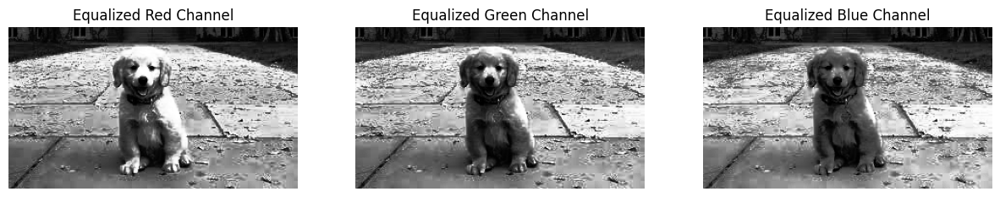

In [45]:
# Apply histogram equalization to each channel
equalized_r_channel = manual_histogram_equalization(r_channel)
equalized_g_channel = manual_histogram_equalization(g_channel)
equalized_b_channel = manual_histogram_equalization(b_channel)

# Display the equalized color channels
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(equalized_r_channel, cmap='gray')
plt.title('Equalized Red Channel')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(equalized_g_channel, cmap='gray')
plt.title('Equalized Green Channel')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(equalized_b_channel, cmap='gray')
plt.title('Equalized Blue Channel')
plt.axis('off')

plt.show()

### Procedure

1. **Apply Histogram Equalization to Each Color Channel**:
   - Use the `manual_histogram_equalization` function to enhance contrast in each color channel separately (Red, Green, and Blue).

2. **Display Equalized Color Channels**:
   - **Equalized Red Channel**: Show the result of applying histogram equalization to the Red channel.
   - **Equalized Green Channel**: Show the result of applying histogram equalization to the Green channel.
   - **Equalized Blue Channel**: Show the result of applying histogram equalization to the Blue channel.

   Utilize Matplotlib to visualize the equalized channels separately.

### Inference

Applying histogram equalization to individual color channels can enhance contrast in each channel, which may help in improving the overall visual quality of the image when the channels are recombined. This approach can also reveal how contrast adjustments affect each channel independently.

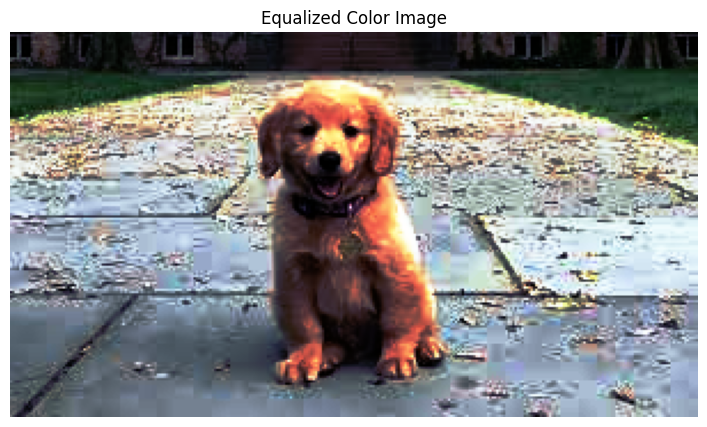

In [46]:
# Merge the equalized color channels
equalized_color_image = cv2.merge((equalized_r_channel, equalized_g_channel, equalized_b_channel))

# Display the equalized color image
plt.figure(figsize=(10, 5))

plt.imshow(equalized_color_image)
plt.title('Equalized Color Image')
plt.axis('off')
plt.show()

### Procedure

1. **Merge Equalized Color Channels**:
   - Combine the equalized Red, Green, and Blue channels back into a single color image using OpenCV's `cv2.merge` function.

2. **Display the Equalized Color Image**:
   - Use Matplotlib to visualize the resulting color image, which should reflect the contrast enhancement applied to each channel.

### Inference

Combining the equalized color channels will produce an image with enhanced contrast across all color channels. This results in a color image where the contrast improvements from individual channels contribute to the overall visual quality. It provides a comprehensive view of how histogram equalization affects the color balance and contrast of the entire image.

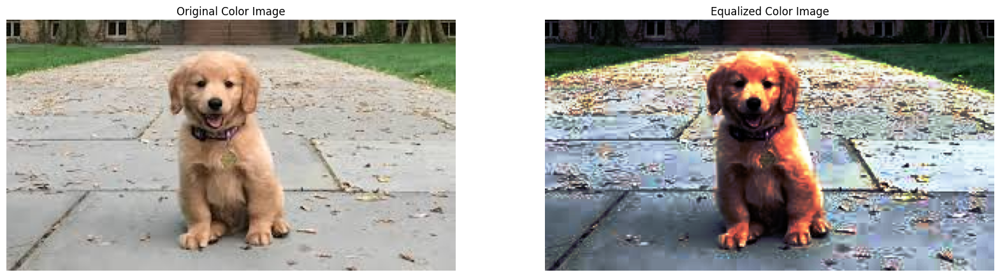

In [47]:
# Display the original and equalized color images side by side
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(color_image)
plt.title('Original Color Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_color_image)
plt.title('Equalized Color Image')
plt.axis('off')

plt.show()

### Procedure

1. **Display Images Side by Side**:
   - Show the original color image and the equalized color image side by side using Matplotlib to compare the contrast improvements.

### Inference

Comparing the original and equalized color images side by side allows for a direct visual assessment of how histogram equalization affects the color image. The equalized image should exhibit enhanced contrast, with more visible details and improved color balance compared to the original.

## Task 4: Histogram Equalization in Different Applications
**Objective:** Explore the use of histogram equalization in various applications.

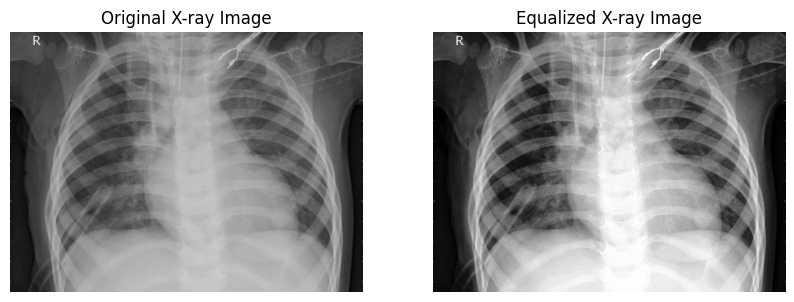

In [48]:
# Load the X-ray image in grayscale
xray_image = cv2.imread('BACTERIA-1025587-0001.jpeg', cv2.IMREAD_GRAYSCALE)

# Apply histogram equalization
equalized_xray_image = manual_histogram_equalization(xray_image)

# Display the original and equalized X-ray images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(xray_image, cmap='gray')
plt.title('Original X-ray Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_xray_image, cmap='gray')
plt.title('Equalized X-ray Image')
plt.axis('off')

plt.show()


### Procedure

1. **Load X-ray Image**:
   - Read the X-ray image in grayscale mode.

2. **Apply Histogram Equalization**:
   - Use the `manual_histogram_equalization` function to enhance the contrast of the X-ray image.

3. **Display Images Side by Side**:
   - Show the original and equalized X-ray images side by side for comparison.

### Inference

Histogram equalization can enhance the contrast in X-ray images, making features more visible and improving diagnostic quality. Comparing the original and equalized images helps in assessing the effectiveness of contrast enhancement.

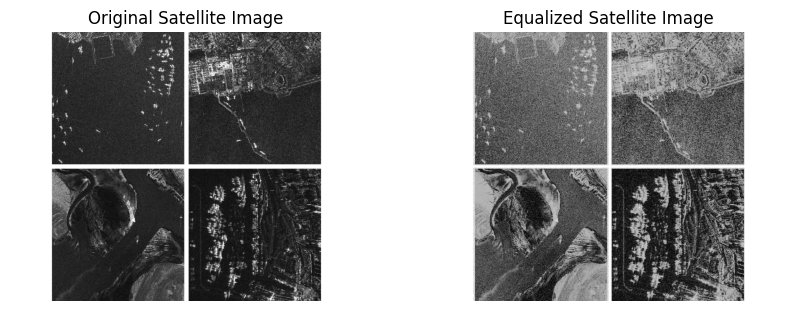

In [49]:
# Load the satellite image in grayscale
satellite_image = cv2.imread('aerial.jpg', cv2.IMREAD_GRAYSCALE)

# Apply histogram equalization
equalized_satellite_image = manual_histogram_equalization(satellite_image)

# Display the original and equalized satellite images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(satellite_image, cmap='gray')
plt.title('Original Satellite Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_satellite_image, cmap='gray')
plt.title('Equalized Satellite Image')
plt.axis('off')

plt.show()

### Procedure

1. **Load Satellite Image**:
   - Read the satellite image in grayscale mode.

2. **Apply Histogram Equalization**:
   - Use the `manual_histogram_equalization` function to enhance the contrast of the satellite image.

3. **Display Images Side by Side**:
   - Show the original and equalized satellite images side by side for comparison.

### Inference

Histogram equalization enhances the contrast in satellite images, which can help in highlighting different features or patterns that were less visible in the original image. By comparing the original and equalized images, you can evaluate how well the contrast enhancement has improved the image quality.

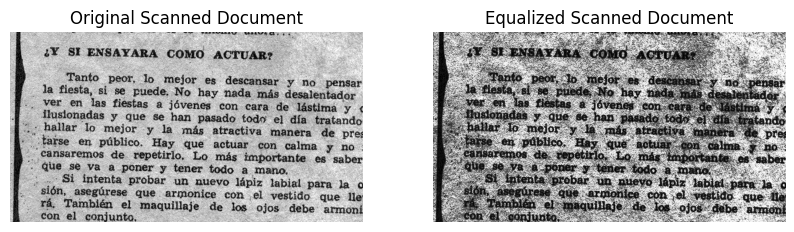

In [50]:
# Load the scanned document image in grayscale
scanned_document = cv2.imread('doc.png', cv2.IMREAD_GRAYSCALE)

# Apply histogram equalization
equalized_document = manual_histogram_equalization(scanned_document)

# Display the original and equalized scanned document images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(scanned_document, cmap='gray')
plt.title('Original Scanned Document')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_document, cmap='gray')
plt.title('Equalized Scanned Document')
plt.axis('off')

plt.show()


### Procedure

1. **Load Scanned Document Image**:
   - Read the scanned document image in grayscale mode.

2. **Apply Histogram Equalization**:
   - Use the `manual_histogram_equalization` function to enhance the contrast of the scanned document image.

3. **Display Images Side by Side**:
   - Show the original and equalized scanned document images side by side for comparison.

### Inference

Histogram equalization can improve the readability of scanned documents by increasing the contrast, making text and details more distinct. Comparing the original and equalized images helps assess the effectiveness of the contrast enhancement.

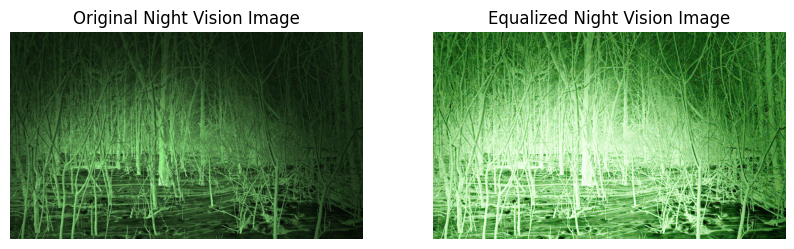

In [55]:
# Load the night vision image in grayscale
night_vision_image = cv2.imread('nv.jpg')

# Apply histogram equalization
equalized_night_vision_image = manual_histogram_equalization(night_vision_image)

# Display the original and equalized night vision images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(night_vision_image)
plt.title('Original Night Vision Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_night_vision_image)
plt.title('Equalized Night Vision Image')
plt.axis('off')

plt.show()


### Procedure

1. **Load Night Vision Image**:
   - Read the night vision image. Ensure it is in grayscale mode for proper processing.

2. **Apply Histogram Equalization**:
   - Use the `manual_histogram_equalization` function to enhance the contrast of the night vision image.

3. **Display Images Side by Side**:
   - Show the original and equalized night vision images side by side to compare the contrast enhancement.

### Inference

Histogram equalization can be particularly useful for night vision images to improve the visibility of details by enhancing the contrast. The comparison between the original and equalized images can help evaluate how well the enhancement has clarified the image.

## Task 5: Histogram Equalization for Low Contrast Images
**Objective:** Improve the visibility of features in images with low contrast.

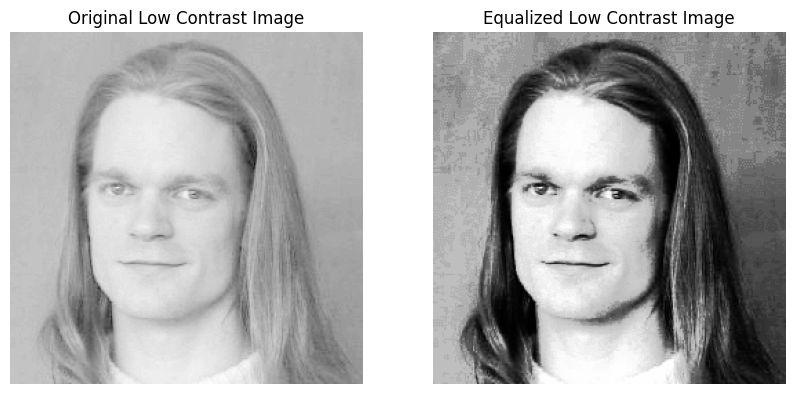

In [58]:
# Load a low contrast image in grayscale
low_contrast_image = cv2.imread('low.png', cv2.IMREAD_GRAYSCALE)
# Apply histogram equalization
equalized_low_contrast_image = manual_histogram_equalization(low_contrast_image)

# Display the original and equalized low contrast images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(low_contrast_image, cmap='gray')
plt.title('Original Low Contrast Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_low_contrast_image, cmap='gray')
plt.title('Equalized Low Contrast Image')
plt.axis('off')

plt.show()

### Procedure

1. **Load Low Contrast Image**:
   - Read the low contrast image in grayscale mode.

2. **Apply Histogram Equalization**:
   - Use the `manual_histogram_equalization` function to enhance the contrast of the low contrast image.

3. **Display Images Side by Side**:
   - Show both the original and equalized low contrast images side by side to compare the enhancement.

### Inference

Histogram equalization is effective in improving the visibility of details in low contrast images by spreading out the pixel values across the available intensity range. Comparing the original and equalized images helps assess the improvement in contrast.

## Task 6: Multi-Scale Histogram Equalization
**Objective:** Explore the effects of applying histogram equalization at different scales.

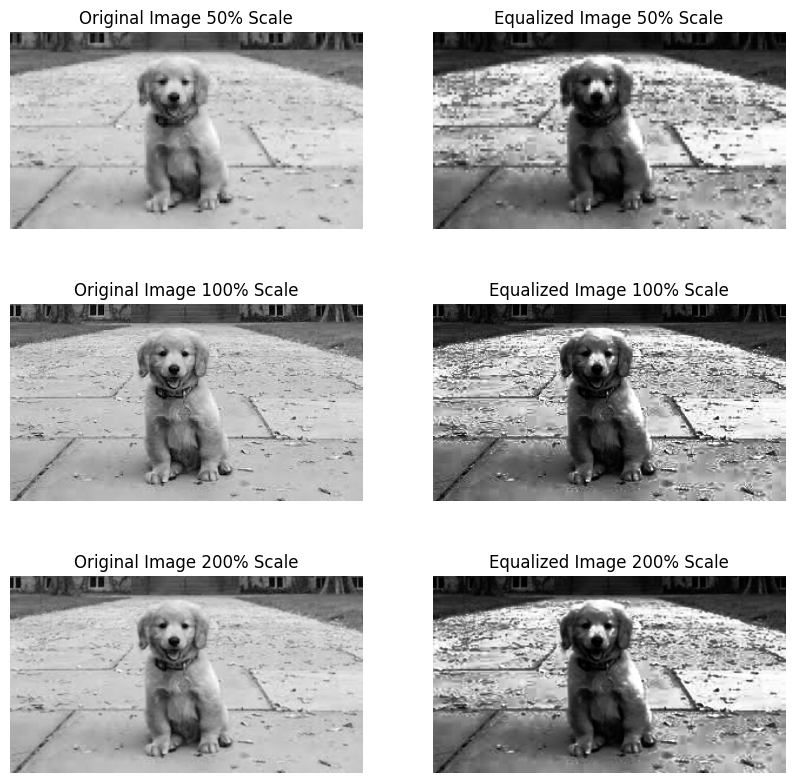

In [60]:
# Load the original image in grayscale
image = img_gs

# Resize the image to different scales
image_50 = cv2.resize(image, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_LINEAR)
image_100 = image  # Original image
image_200 = cv2.resize(image, None, fx=2.0, fy=2.0, interpolation=cv2.INTER_LINEAR)

# Apply histogram equalization to the resized images
equalized_image_50 = manual_histogram_equalization(image_50)
equalized_image_100 = manual_histogram_equalization(image_100)
equalized_image_200 = manual_histogram_equalization(image_200)

# Display the original and equalized images at different scales
plt.figure(figsize=(10, 10))

# Original images
plt.subplot(3, 2, 1)
plt.imshow(image_50, cmap='gray')
plt.title('Original Image 50% Scale')
plt.axis('off')

plt.subplot(3, 2, 3)
plt.imshow(image_100, cmap='gray')
plt.title('Original Image 100% Scale')
plt.axis('off')

plt.subplot(3, 2, 5)
plt.imshow(image_200, cmap='gray')
plt.title('Original Image 200% Scale')
plt.axis('off')

# Equalized images
plt.subplot(3, 2, 2)
plt.imshow(equalized_image_50, cmap='gray')
plt.title('Equalized Image 50% Scale')
plt.axis('off')

plt.subplot(3, 2, 4)
plt.imshow(equalized_image_100, cmap='gray')
plt.title('Equalized Image 100% Scale')
plt.axis('off')

plt.subplot(3, 2, 6)
plt.imshow(equalized_image_200, cmap='gray')
plt.title('Equalized Image 200% Scale')
plt.axis('off')

plt.show()

### Procedure

1. **Resize the Image**:
   - Resize the grayscale image to 50% and 200% of the original size using linear interpolation.
   
2. **Apply Histogram Equalization**:
   - Perform histogram equalization on each resized version of the image.

3. **Display Images**:
   - Show both the original and equalized images at different scales for comparison.
### Inference

Histogram equalization can be applied effectively across different scales, but the results can vary based on image size. Comparing the original and equalized images at different scales helps understand how scaling affects the enhancement.

## Task 7: Histogram Equalization for Image Enhancement
**Objective:** Use histogram equalization to enhance images for better visual analysis.

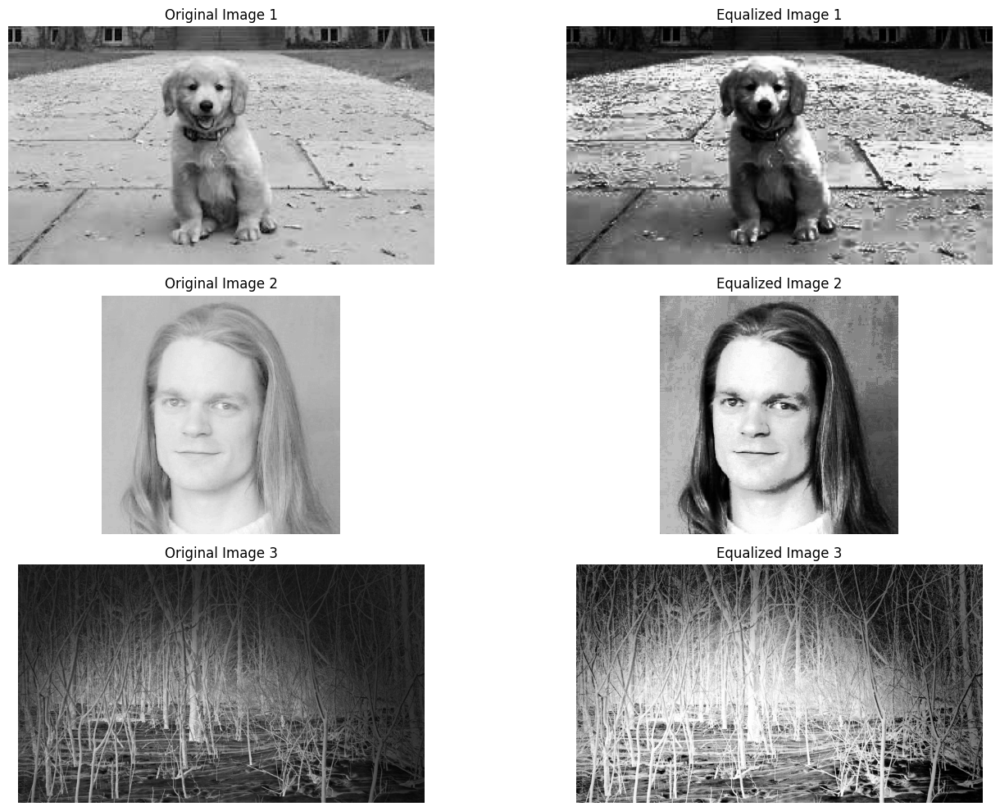

In [62]:

# Load sample images with varying levels of detail and contrast
image_paths = ['dog.jpeg', 'low.png', 'nv.jpg']
images = [cv2.imread(path, cv2.IMREAD_GRAYSCALE) for path in image_paths]

# Apply histogram equalization to each image
equalized_images = [manual_histogram_equalization(img) for img in images]

# Display the original and equalized images
plt.figure(figsize=(15, 10))

for i, (original, equalized) in enumerate(zip(images, equalized_images)):
    plt.subplot(len(images), 2, 2*i + 1)
    plt.imshow(original, cmap='gray')
    plt.title(f'Original Image {i+1}')
    plt.axis('off')

    plt.subplot(len(images), 2, 2*i + 2)
    plt.imshow(equalized, cmap='gray')
    plt.title(f'Equalized Image {i+1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

### Procedure

1. **Load the Images**:
   - Use `cv2.imread()` to load the images in grayscale mode. This ensures you are working with single-channel images suitable for histogram equalization.

2. **Apply Histogram Equalization**:
   - For each image, apply the `manual_histogram_equalization` function to enhance the contrast. This function computes the histogram, cumulative distribution function (CDF), and maps pixel values based on the CDF.

3. **Display Results**:
   - Create a plot with original and equalized images side-by-side. This allows for a visual comparison of the image enhancements.

### Inference

1. **Original vs. Equalized Images**:
   - **Detail Enhancement**: Histogram equalization generally improves the visibility of details in images with low contrast. This is noticeable in images like `low.png`, where the equalized version shows more contrast and details.
   - **Consistency**: For images with good contrast already (`nv.jpg`), the equalized image may not show significant improvements, but it still standardizes contrast across the image.

2. **Image Characteristics**:
   - **Low Contrast Images**: Histogram equalization enhances contrast by redistributing pixel values, making features more distinct.
   - **High Contrast or Well-Exposed Images**: The enhancement may be less noticeable, but the process ensures uniform contrast distribution.

3. **Effectiveness Across Image Types**:
   - **Varied Contrast**: Applying equalization to images with different inherent contrast levels (e.g., `dog.jpeg` vs. `low.png`) highlights the technique’s ability to enhance visibility across diverse conditions.
   - **General Use**: Histogram equalization is a versatile method applicable to various types of images, from scanned documents to night vision imagery, improving their visual quality.

This approach demonstrates the effectiveness of histogram equalization in different scenarios and its ability to enhance image details by improving contrast.

## Task 8: Histogram Equalization in Image Segmentation
**Objective:** Assess the impact of histogram equalization on image segmentation performance.

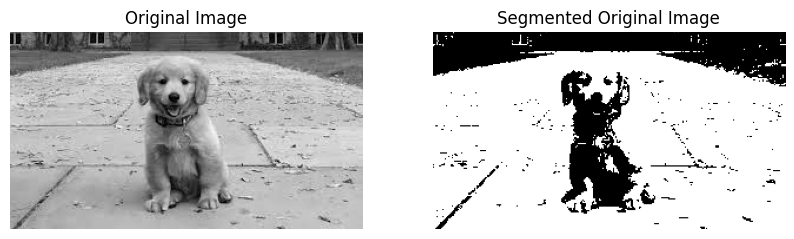

In [63]:
# Load a sample image in grayscale
image = img_gs

# Perform simple thresholding for segmentation
_, segmented_original = cv2.threshold(image, 128, 255, cv2.THRESH_BINARY)

# Display the original and segmented images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmented_original, cmap='gray')
plt.title('Segmented Original Image')
plt.axis('off')
plt.show()

### Procedure for Thresholding Segmentation

1. **Load the Image**:
   - Load the grayscale image (`img_gs` in this case) using OpenCV functions.

2. **Apply Simple Thresholding**:
   - Use `cv2.threshold()` to perform binary thresholding. This involves setting a threshold value (128 here) and classifying pixels into two categories:
     - Pixels with values greater than the threshold are set to the maximum value (255).
     - Pixels with values less than or equal to the threshold are set to 0.

3. **Display Results**:
   - Use `matplotlib.pyplot` to show both the original and the segmented images side by side for comparison.

### Inference

1. **Thresholding Effectiveness**:
   - **Segmentation**: The thresholding process segments the image into two distinct regions based on pixel intensity. This can be useful for isolating features or objects of interest in binary form.
   - **Binary Image**: The resulting segmented image will be a binary image where the segmented areas are white (255) and the non-segmented areas are black (0).

2. **Threshold Choice**:
   - **Fixed Threshold**: In this case, a fixed threshold of 128 is used. The choice of threshold can significantly impact the segmentation quality. An adaptive approach may be needed for varying lighting conditions or image characteristics.

3. **Applications**:
   - **Feature Extraction**: Thresholding is often the first step in image preprocessing for tasks like object detection, feature extraction, or further analysis.

This method provides a simple and effective way to perform basic image segmentation. Adjustments to the threshold value can improve segmentation results depending on the image content and desired outcomes.

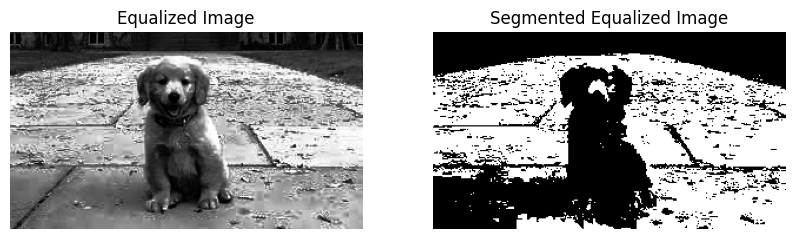

In [64]:
# Apply histogram equalization
equalized_image = manual_histogram_equalization(image)

# Perform the same thresholding for segmentation on the equalized image
_, segmented_equalized = cv2.threshold(equalized_image, 128, 255, cv2.THRESH_BINARY)

# Display the equalized and segmented images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmented_equalized, cmap='gray')
plt.title('Segmented Equalized Image')
plt.axis('off')
plt.show()

### Procedure for Histogram Equalization and Segmentation

1. **Load and Equalize the Image**:
   - First, perform histogram equalization on the grayscale image (`image`). This step enhances the contrast of the image by redistributing the pixel intensity values.

2. **Apply Thresholding for Segmentation**:
   - After equalization, apply simple thresholding using `cv2.threshold()` with a threshold value of 128. This converts the equalized image into a binary image, where pixels are classified into two categories: those above the threshold (set to 255) and those below or equal to the threshold (set to 0).

3. **Display Results**:
   - Use `matplotlib.pyplot` to visualize both the equalized image and the binary segmented image side by side.

### Inference

1. **Impact of Histogram Equalization**:
   - **Enhanced Contrast**: Histogram equalization improves the contrast of the image, which can make features more distinguishable. This can be particularly useful if the original image has low contrast.
   - **Segmentation Improvement**: By enhancing the contrast, histogram equalization may make the thresholding process more effective, as the difference between foreground and background intensities might be more pronounced.

2. **Thresholding Post-Equalization**:
   - **Binary Image**: The segmented image resulting from thresholding the equalized image will highlight features that are now more distinct due to the improved contrast.
   - **Effectiveness**: The effectiveness of the segmentation can be evaluated by comparing the binary image to the original segmentation. Improved contrast often results in clearer and more accurate segmentation.

3. **Applications**:
   - **Enhanced Segmentation**: Applying histogram equalization before segmentation can be particularly beneficial in images with poor contrast, as it can improve the visibility of features and enhance the quality of segmentation results.
   - **Preprocessing**: Histogram equalization is often used as a preprocessing step in various image processing tasks to improve the results of subsequent operations like segmentation.

This combined approach can significantly improve the results of image analysis tasks by first enhancing the image's contrast and then performing segmentation.

# Conclusion

**Histogram equalization is a powerful preprocessing technique that enhances image contrast by redistributing pixel intensity values. This improvement in contrast often leads to more effective and accurate segmentation, as features become more distinct and distinguishable. When applied to various images—whether grayscale or color, and regardless of the original quality or contrast—histogram equalization can significantly enhance the visibility of features and improve the outcomes of image analysis tasks. Additionally, the effectiveness of segmentation techniques, such as simple thresholding and adaptive methods, can be markedly improved when used in conjunction with histogram equalization.**